# ***README***

![](https://i.imgur.com/sZ8MvdO.png)

**Authors**: 

*Leo Arriola,
Zixuan Sun*

> **NOTE:** To install all the requirements from *requirements.txt*, please execute:  ```pip install -r requirements.txt```

> Original Google Collab (only for *upc.edu*): [here](https://drive.google.com/file/d/1G0hcXaBT4cMkkIIAr2VjkaePVtzjq5co/view?usp=sharing)

--------------

# **FINAL APA PROJECT**

 
## *Predicting students grades*

### Introduction

In this project, we are going to study the correlation between demographic attributes and their relationship with academic performance. The dataset we've chosen is formed by attributes that a priori are interrelated with the academic performance of secondary school students. This includes the level of education of their parents, their parent's job and other similar attributes. The dataset allows us to treat it as a regression problem or through classification problem. In summary, the dataset has $33$ attributes (some numerical and some categorical) and a total of $395$ samples.


The dataset was extracted from the $\texttt{UC Irvine Machine Learning Repository}$, it is a collection of databases, domain theories, and data generators that are used by the machine learning community for the empirical analysis of machine learning algorithms. It was originated by *David Aha* and fellow graduates from $\texttt{UC Irvine}$.


The full dataset can be obtained from [here](https://archive.ics.uci.edu/ml/datasets/student+performance) , this includes the **.csv** files and other descriptive documents about the dataset. Regarding the source of this dataset, we know that it was collected through school reports and questionnaires from a Portuguese school (in *Cortez \& Silva*, *2008*).

In [ ]:
# Uncomment to upgrade packages
# !pip install pandas --user --upgrade --quiet
# !pip install numpy --user --upgrade --quiet
# !pip install scipy --user --upgrade --quiet
# !pip install statsmodels --user --upgrade --quiet
# !pip install seaborn --user --upgrade --quiet
# !pip install scikit-learn --user --upgrade --quiet

%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
#%matplotlib notebook

from time import time
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib
#matplotlib.rcParams['font.size'] = 16
matplotlib.rcParams['figure.figsize'] = (9, 9)

import seaborn as sns
import pandas as pd
from collections import Counter
from IPython.core.interactiveshell import InteractiveShell
import warnings
from scipy.stats import percentileofscore

In [ ]:
# extra imports
from pandas import read_csv
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR, LinearSVR
from sklearn.neighbors import LocalOutlierFactor
from sklearn.model_selection import train_test_split,  KFold, cross_val_score
from sklearn.linear_model import LogisticRegression,LinearRegression, Ridge, Lasso
from sklearn.metrics import explained_variance_score,mean_absolute_error,r2_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn import preprocessing
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
#from statsmodels.genmod.generalized_linear_model import GLM
from pandas.plotting import scatter_matrix
from scipy.stats import boxcox

In [ ]:
pd.__version__

'1.1.5'

# 1. Pre-process

## Reading .csv

In [ ]:
Data = read_csv("../data/student-mat.csv", header=0, delimiter=';', quotechar='"')
Data.shape

(395, 33)

In [ ]:
Data.columns

Index(['school', 'sex', 'age', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu',
       'Mjob', 'Fjob', 'reason', 'guardian', 'traveltime', 'studytime',
       'failures', 'schoolsup', 'famsup', 'paid', 'activities', 'nursery',
       'higher', 'internet', 'romantic', 'famrel', 'freetime', 'goout', 'Dalc',
       'Walc', 'health', 'absences', 'G1', 'G2', 'G3'],
      dtype='object')

In [ ]:
Data[:4]

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,3,yes,no,yes,no,yes,yes,yes,no,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,yes,yes,yes,yes,yes,yes,3,2,2,1,1,5,2,15,14,15


In [ ]:
Data.describe()

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
count,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000
mean,16.696203,2.749367,2.521519,1.448101,2.035443,0.334177,3.944304,3.235443,3.108861,1.481013,2.291139,3.554430,5.708861,10.908861,10.713924,10.415190
std,1.276043,1.094735,1.088201,0.697505,0.839240,0.743651,0.896659,0.998862,1.113278,0.890741,1.287897,1.390303,8.003096,3.319195,3.761505,4.581443
min,15.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,3.000000,0.000000,0.000000
25%,16.000000,2.000000,2.000000,1.000000,1.000000,0.000000,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,0.000000,8.000000,9.000000,8.000000
50%,17.000000,3.000000,2.000000,1.000000,2.000000,0.000000,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,4.000000,11.000000,11.000000,11.000000
75%,18.000000,4.000000,3.000000,2.000000,2.000000,0.000000,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,8.000000,13.000000,13.000000,14.000000
max,22.000000,4.000000,4.000000,4.000000,4.000000,3.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,75.000000,19.000000,19.000000,20.000000


## Dealing with missing values

In [ ]:
Data_complt = Data.dropna()
Data_complt.shape

(395, 33)

In [ ]:
Data[:].isnull().sum()

school        0
sex           0
age           0
address       0
famsize       0
Pstatus       0
Medu          0
Fedu          0
Mjob          0
Fjob          0
reason        0
guardian      0
traveltime    0
studytime     0
failures      0
schoolsup     0
famsup        0
paid          0
activities    0
nursery       0
higher        0
internet      0
romantic      0
famrel        0
freetime      0
goout         0
Dalc          0
Walc          0
health        0
absences      0
G1            0
G2            0
G3            0
dtype: int64

## Finding outliers

In [ ]:
Data.dtypes == 'object'

school         True
sex            True
age           False
address        True
famsize        True
Pstatus        True
Medu          False
Fedu          False
Mjob           True
Fjob           True
reason         True
guardian       True
traveltime    False
studytime     False
failures      False
schoolsup      True
famsup         True
paid           True
activities     True
nursery        True
higher         True
internet       True
romantic       True
famrel        False
freetime      False
goout         False
Dalc          False
Walc          False
health        False
absences      False
G1            False
G2            False
G3            False
dtype: bool

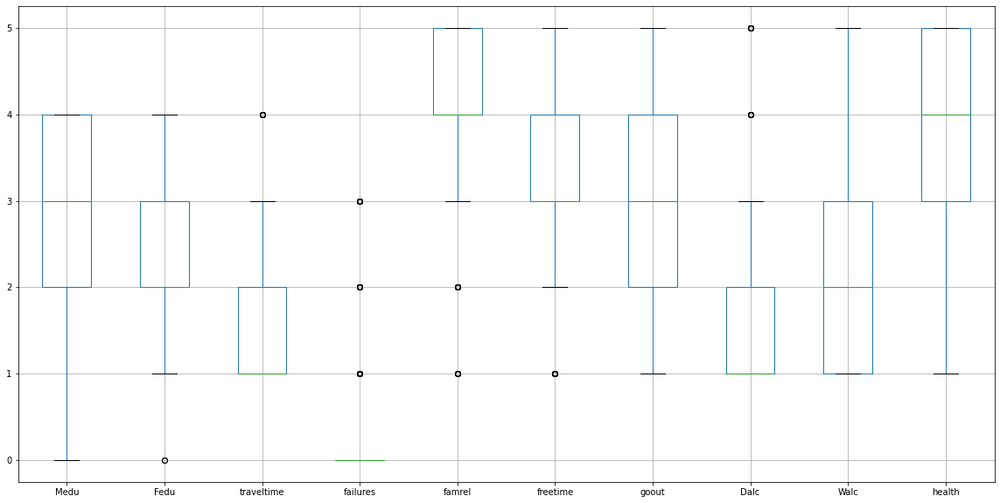

In [ ]:
num = ['Medu','Fedu','traveltime','failures','famrel','freetime','goout','Dalc','Walc','health']
fig, ax = plt.subplots(figsize=(20,10))
Data[num].boxplot()

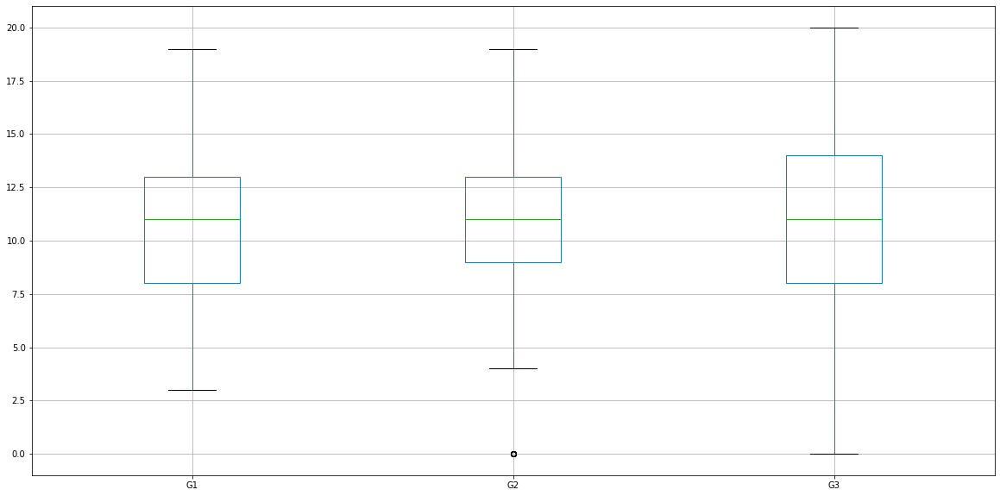

In [ ]:
num = ['G1', 'G2', 'G3']
fig, ax = plt.subplots(figsize=(20,10))
Data[num].boxplot()

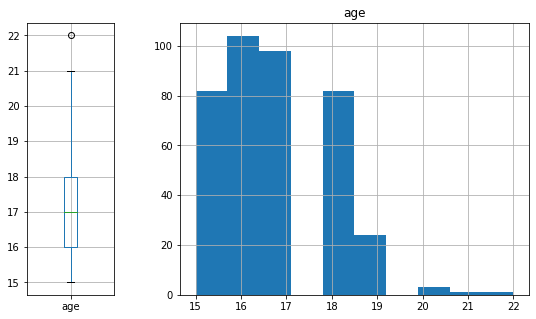

In [ ]:
fig, axes = plt.subplots(1,2, gridspec_kw={'width_ratios': [1, 4]}, figsize=(9,5))
Data.boxplot(column='age',ax=axes[0]);
Data.hist(column='age', ax=axes[1]);

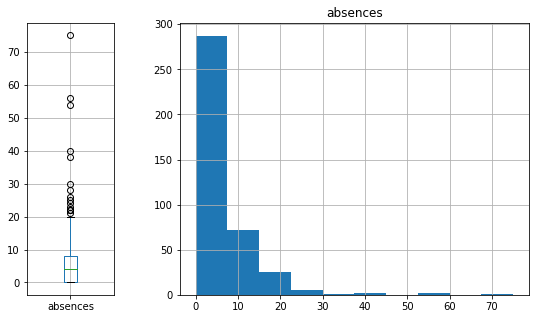

In [ ]:
fig, axes = plt.subplots(1,2, gridspec_kw={'width_ratios': [1, 4]}, figsize=(9,5))
Data.boxplot(column='absences',ax=axes[0]);
Data.hist(column='absences', ax=axes[1]);

In [ ]:
(Data.age==16).value_counts()

False    291
True     104
Name: age, dtype: int64

In [ ]:
(Data.age==17).value_counts()

False    297
True      98
Name: age, dtype: int64

In [ ]:
(Data.age==18).value_counts()

False    313
True      82
Name: age, dtype: int64

In [ ]:
Q1age = Data['age'].quantile(0.25)
Q3age = Data['age'].quantile(0.75)
IQRage = Q3age - Q1age

Q1age, Q3age, IQRage

(16.0, 18.0, 2.0)

In [ ]:
small_outliers_age = Data['age'] < (Q1age - 1.5 * IQRage)
big_outliers_age = Data['age'] > (Q3age + 1.5 * IQRage)

sum(small_outliers_age), sum(big_outliers_age)

(0, 1)

In [ ]:
Data['age'][small_outliers_age | big_outliers_age].head()

247    22
Name: age, dtype: int64

In [ ]:
Data[247:248]

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
247,GP,M,22,U,GT3,T,3,1,services,services,other,mother,1,1,3,no,no,no,no,no,no,yes,yes,5,4,5,5,5,1,16,6,8,8


In [ ]:
Q1ab = Data['absences'].quantile(0.25)
Q3ab = Data['absences'].quantile(0.75)
IQRab = Q3ab - Q1ab

Q1ab, Q3ab, IQRab

(0.0, 8.0, 8.0)

In [ ]:
small_outliers_ab = Data['absences'] < (Q1ab - 1.5 * IQRab)
big_outliers_ab = Data['absences'] > (Q3ab + 1.5 * IQRab)

sum(small_outliers_ab), sum(big_outliers_ab)

(0, 15)

In [ ]:
Data['absences'][small_outliers_ab | big_outliers_ab].head(15)

40     25
74     54
103    26
183    56
198    24
205    28
216    22
260    21
276    75
277    22
280    30
307    38
313    22
315    40
320    23
Name: absences, dtype: int64

In [ ]:
Data[276:277]

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
276,GP,F,18,R,GT3,A,3,2,other,services,home,mother,2,2,0,no,no,no,no,no,no,yes,yes,4,1,1,1,1,5,75,10,9,9


## Finding incoherent values

In [ ]:
Data.describe(include='all')

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
count,395,395,395.000000,395,395,395,395.000000,395.000000,395,395,395,395,395.000000,395.000000,395.000000,395,395,395,395,395,395,395,395,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000
unique,2,2,NaN,2,2,2,NaN,NaN,5,5,4,3,NaN,NaN,NaN,2,2,2,2,2,2,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,GP,F,NaN,U,GT3,T,NaN,NaN,other,other,course,mother,NaN,NaN,NaN,no,yes,no,yes,yes,yes,yes,no,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,349,208,NaN,307,281,354,NaN,NaN,141,217,145,273,NaN,NaN,NaN,344,242,214,201,314,375,329,263,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,16.696203,NaN,NaN,NaN,2.749367,2.521519,NaN,NaN,NaN,NaN,1.448101,2.035443,0.334177,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.944304,3.235443,3.108861,1.481013,2.291139,3.554430,5.708861,10.908861,10.713924,10.415190
std,NaN,NaN,1.276043,NaN,NaN,NaN,1.094735,1.088201,NaN,NaN,NaN,NaN,0.697505,0.839240,0.743651,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.896659,0.998862,1.113278,0.890741,1.287897,1.390303,8.003096,3.319195,3.761505,4.581443
min,NaN,NaN,15.000000,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,1.000000,1.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,3.000000,0.000000,0.000000
25%,NaN,NaN,16.000000,NaN,NaN,NaN,2.000000,2.000000,NaN,NaN,NaN,NaN,1.000000,1.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,0.000000,8.000000,9.000000,8.000000
50%,NaN,NaN,17.000000,NaN,NaN,NaN,3.000000,2.000000,NaN,NaN,NaN,NaN,1.000000,2.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,4.000000,11.000000,11.000000,11.000000
75%,NaN,NaN,18.000000,NaN,NaN,NaN,4.000000,3.000000,NaN,NaN,NaN,NaN,2.000000,2.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,8.000000,13.000000,13.000000,14.000000


## Coding of non-continuous

In [ ]:
#identify all categorical variables
cat_columns = Data.select_dtypes(['object']).columns

#convert all categorical variables to numeric
Data[cat_columns] = Data[cat_columns].apply(lambda x: pd.factorize(x)[0])

In [ ]:
Data.describe(include='all')

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
count,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000
mean,0.116456,0.473418,16.696203,0.222785,0.288608,0.896203,2.749367,2.521519,2.169620,1.450633,1.440506,0.389873,1.448101,2.035443,0.334177,0.870886,0.612658,0.458228,0.508861,0.205063,0.050633,0.832911,0.334177,3.944304,3.235443,3.108861,1.481013,2.291139,3.554430,5.708861,10.908861,10.713924,10.415190
std,0.321177,0.499926,1.276043,0.416643,0.453690,0.305384,1.094735,1.088201,1.227473,0.889572,1.231309,0.633176,0.697505,0.839240,0.743651,0.335751,0.487761,0.498884,0.500555,0.404260,0.219525,0.373528,0.472300,0.896659,0.998862,1.113278,0.890741,1.287897,1.390303,8.003096,3.319195,3.761505,4.581443
min,0.000000,0.000000,15.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,3.000000,0.000000,0.000000
25%,0.000000,0.000000,16.000000,0.000000,0.000000,1.000000,2.000000,2.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,0.000000,8.000000,9.000000,8.000000
50%,0.000000,0.000000,17.000000,0.000000,0.000000,1.000000,3.000000,2.000000,2.000000,1.000000,2.000000,0.000000,1.000000,2.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,4.000000,11.000000,11.000000,11.000000
75%,0.000000,1.000000,18.000000,0.000000,1.000000,1.000000,4.000000,3.000000,3.000000,2.000000,3.000000,1.000000,2.000000,2.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,8.000000,13.000000,13.000000,14.000000
max,1.000000,1.000000,22.000000,1.000000,1.000000,1.000000,4.000000,4.000000,4.000000,4.000000,3.000000,2.000000,4.000000,4.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,75.000000,19.000000,19.000000,20.000000


## Feature extraction

In [ ]:
Data['performanceFailure'] = (Data['G1']*0.4 + Data['G2']*0.6)/(Data['failures']+1)

In [ ]:
Data.describe()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3,performanceFailure
count,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000
mean,0.116456,0.473418,16.696203,0.222785,0.288608,0.896203,2.749367,2.521519,2.169620,1.450633,1.440506,0.389873,1.448101,2.035443,0.334177,0.870886,0.612658,0.458228,0.508861,0.205063,0.050633,0.832911,0.334177,3.944304,3.235443,3.108861,1.481013,2.291139,3.554430,5.708861,10.908861,10.713924,10.415190,9.774135
std,0.321177,0.499926,1.276043,0.416643,0.453690,0.305384,1.094735,1.088201,1.227473,0.889572,1.231309,0.633176,0.697505,0.839240,0.743651,0.335751,0.487761,0.498884,0.500555,0.404260,0.219525,0.373528,0.472300,0.896659,0.998862,1.113278,0.890741,1.287897,1.390303,8.003096,3.319195,3.761505,4.581443,4.388737
min,0.000000,0.000000,15.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,3.000000,0.000000,0.000000,0.500000
25%,0.000000,0.000000,16.000000,0.000000,0.000000,1.000000,2.000000,2.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,0.000000,8.000000,9.000000,8.000000,6.400000
50%,0.000000,0.000000,17.000000,0.000000,0.000000,1.000000,3.000000,2.000000,2.000000,1.000000,2.000000,0.000000,1.000000,2.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,4.000000,11.000000,11.000000,11.000000,10.000000
75%,0.000000,1.000000,18.000000,0.000000,1.000000,1.000000,4.000000,3.000000,3.000000,2.000000,3.000000,1.000000,2.000000,2.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,8.000000,13.000000,13.000000,14.000000,13.000000
max,1.000000,1.000000,22.000000,1.000000,1.000000,1.000000,4.000000,4.000000,4.000000,4.000000,3.000000,2.000000,4.000000,4.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,75.000000,19.000000,19.000000,20.000000,19.000000


## Feature selection

In [ ]:
newData = Data.drop(columns=['G1', 'G2'])
newData.shape

(395, 32)

In [ ]:
newData.describe()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G3,performanceFailure
count,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000
mean,0.116456,0.473418,16.696203,0.222785,0.288608,0.896203,2.749367,2.521519,2.169620,1.450633,1.440506,0.389873,1.448101,2.035443,0.334177,0.870886,0.612658,0.458228,0.508861,0.205063,0.050633,0.832911,0.334177,3.944304,3.235443,3.108861,1.481013,2.291139,3.554430,5.708861,10.415190,9.774135
std,0.321177,0.499926,1.276043,0.416643,0.453690,0.305384,1.094735,1.088201,1.227473,0.889572,1.231309,0.633176,0.697505,0.839240,0.743651,0.335751,0.487761,0.498884,0.500555,0.404260,0.219525,0.373528,0.472300,0.896659,0.998862,1.113278,0.890741,1.287897,1.390303,8.003096,4.581443,4.388737
min,0.000000,0.000000,15.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.500000
25%,0.000000,0.000000,16.000000,0.000000,0.000000,1.000000,2.000000,2.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,0.000000,8.000000,6.400000
50%,0.000000,0.000000,17.000000,0.000000,0.000000,1.000000,3.000000,2.000000,2.000000,1.000000,2.000000,0.000000,1.000000,2.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,4.000000,11.000000,10.000000
75%,0.000000,1.000000,18.000000,0.000000,1.000000,1.000000,4.000000,3.000000,3.000000,2.000000,3.000000,1.000000,2.000000,2.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,8.000000,14.000000,13.000000
max,1.000000,1.000000,22.000000,1.000000,1.000000,1.000000,4.000000,4.000000,4.000000,4.000000,3.000000,2.000000,4.000000,4.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,75.000000,20.000000,19.000000


## Normalization

In [ ]:
min_max_scaler = preprocessing.MinMaxScaler()
newData[['Age_min_max', 'Absences_min_max']] = min_max_scaler.fit_transform(newData[['age', 'absences']])

In [ ]:
newData = newData.drop(columns=['age','absences'])
newData.describe()

,school,sex,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,G3,performanceFailure,Age_min_max,Absences_min_max
count,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000
mean,0.116456,0.473418,0.222785,0.288608,0.896203,2.749367,2.521519,2.169620,1.450633,1.440506,0.389873,1.448101,2.035443,0.334177,0.870886,0.612658,0.458228,0.508861,0.205063,0.050633,0.832911,0.334177,3.944304,3.235443,3.108861,1.481013,2.291139,3.554430,10.415190,9.774135,0.242315,0.076118
std,0.321177,0.499926,0.416643,0.453690,0.305384,1.094735,1.088201,1.227473,0.889572,1.231309,0.633176,0.697505,0.839240,0.743651,0.335751,0.487761,0.498884,0.500555,0.404260,0.219525,0.373528,0.472300,0.896659,0.998862,1.113278,0.890741,1.287897,1.390303,4.581443,4.388737,0.182292,0.106708
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.500000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,2.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,8.000000,6.400000,0.142857,0.000000
50%,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000,2.000000,2.000000,1.000000,2.000000,0.000000,1.000000,2.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,11.000000,10.000000,0.285714,0.053333
75%,0.000000,1.000000,0.000000,1.000000,1.000000,4.000000,3.000000,3.000000,2.000000,3.000000,1.000000,2.000000,2.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,14.000000,13.000000,0.428571,0.106667
max,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,4.000000,4.000000,4.000000,3.000000,2.000000,4.000000,4.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,20.000000,19.000000,1.000000,1.000000


In [ ]:
daux = newData.pop('G3')
newData['G3'] = daux

In [ ]:
newData.to_csv('./student-mat-preprocessed.csv', index=False)
newData.head()

,school,sex,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,performanceFailure,Age_min_max,Absences_min_max,G3
0,0,0,0,0,0,4,4,0,0,0,0,2,2,0,0,0,0,0,0,0,0,0,4,3,4,1,1,3,5.6,0.428571,0.080000,6
1,0,0,0,0,1,1,1,0,1,0,1,1,2,0,1,1,0,0,1,0,1,0,5,3,3,1,1,3,5.0,0.285714,0.053333,6
2,0,0,0,1,1,1,1,0,1,1,0,1,2,3,0,0,1,0,0,0,1,0,4,3,2,2,3,3,1.9,0.000000,0.133333,10
3,0,0,0,0,1,4,2,1,2,2,0,1,3,0,1,1,1,1,0,0,1,1,3,2,2,1,1,5,14.4,0.000000,0.026667,15
4,0,0,0,0,1,3,3,2,1,2,1,1,2,0,1,1,1,0,0,0,0,0,4,3,2,1,2,5,8.4,0.142857,0.053333,10


# Visualizating the data

In [ ]:
oriData = read_csv("student-mat.csv", header=0, delimiter=';', quotechar='"')
oriData.shape

(395, 33)

In [ ]:
#sns.pairplot(Data);

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA().fit(Data)

n_components =(pca.explained_variance_ratio_.cumsum() < 0.99).sum()
n_components

22

In [ ]:
pca = PCA(n_components=n_components).fit(Data)

data_pca = pca.transform(Data)


In [ ]:
import plotly.express as px

data_st = StandardScaler().fit_transform(Data)

pca = PCA(n_components = 5)
components = pca.fit_transform(data_st)
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(5),
    color=Data['G3']
)

fig.update_traces(diagonal_visible=False)
fig.show()

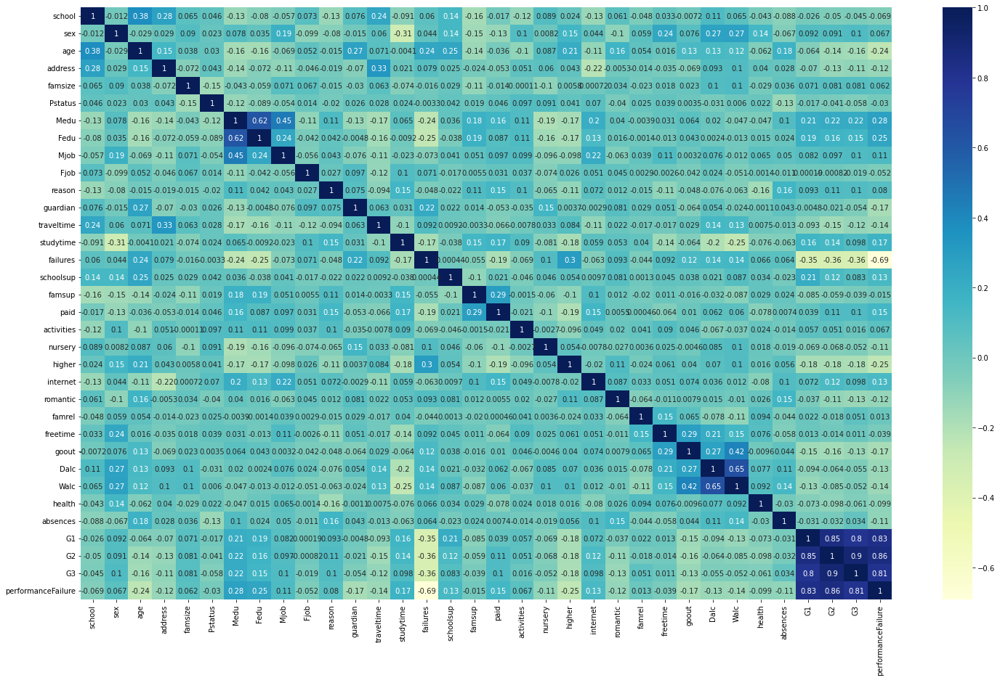

In [ ]:
corrMatrix = Data.corr()
plt.figure(figsize=(25,15))
sns.heatmap(corrMatrix, cmap="YlGnBu", annot=True)
plt.show()

Text(0.5, 1.0, 'Numbers of students of each sex')

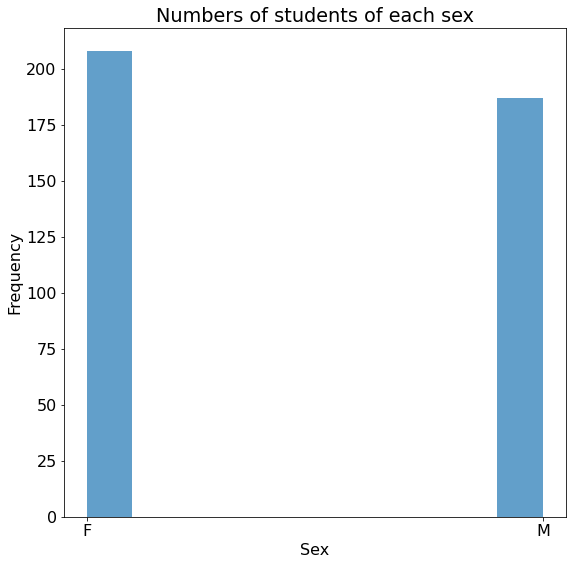

In [ ]:
matplotlib.rcParams['font.size'] = 16
plt.hist(x=oriData['sex'], alpha=0.7)
plt.xlabel('Sex')
plt.ylabel('Frequency')
plt.title('Numbers of students of each sex')

Text(0.5, 1.0, 'G3 grades distribution')

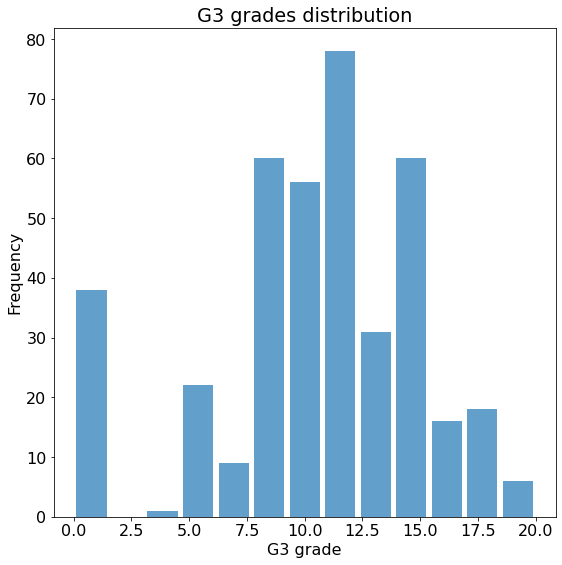

In [ ]:
plt.hist(x=oriData['G3'], bins='auto',
                            alpha=0.7, rwidth=0.85)
plt.xlabel('G3 grade')
plt.ylabel('Frequency')
plt.title('G3 grades distribution')

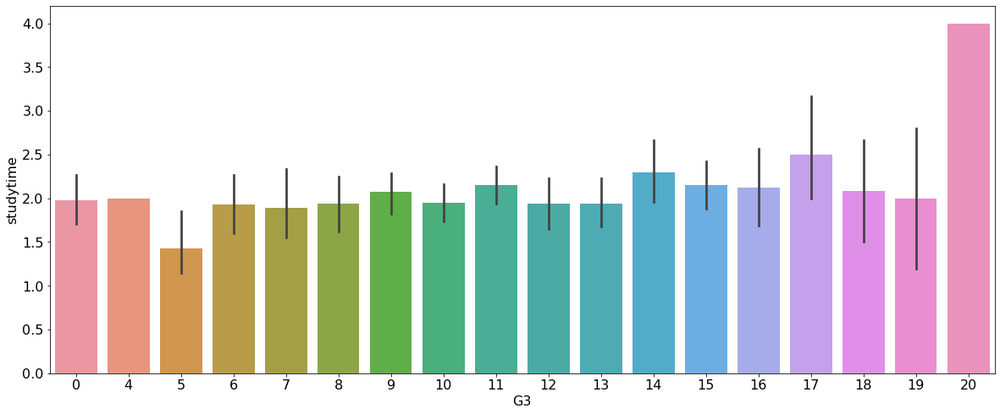

In [ ]:
fig_dims = (20, 8)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x = oriData["G3"], y = oriData["studytime"], ax=ax, data= oriData)

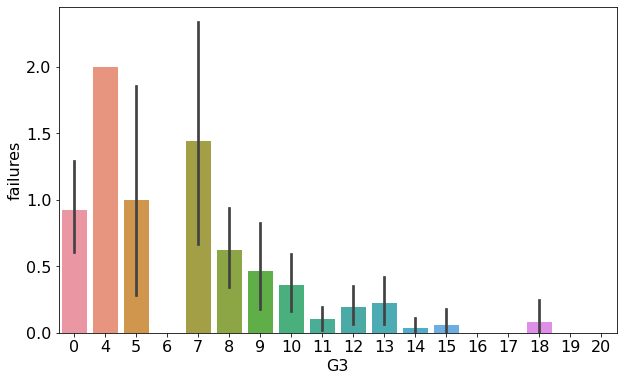

In [ ]:
fig_dims = (10, 6)
matplotlib.rcParams['font.size'] = 16
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x = oriData["G3"], y = oriData["failures"], ax=ax, data=oriData)

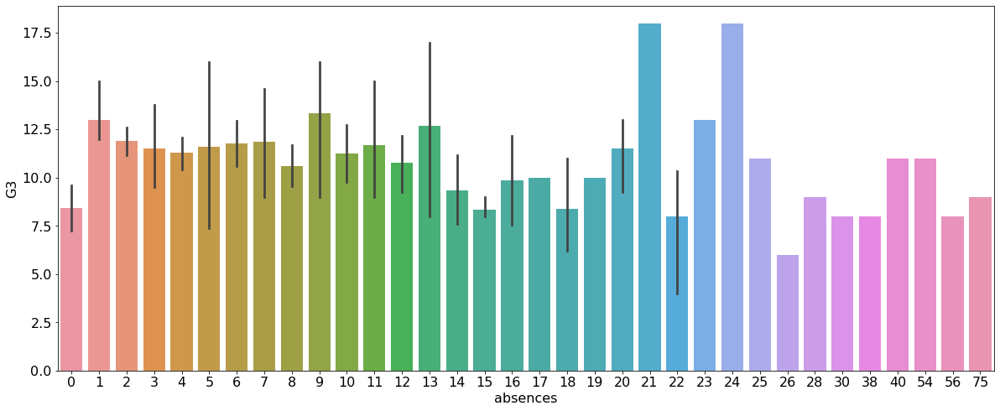

In [ ]:
fig_dims = (20, 8)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x = oriData["absences"], y = oriData["G3"], ax=ax, data= oriData)

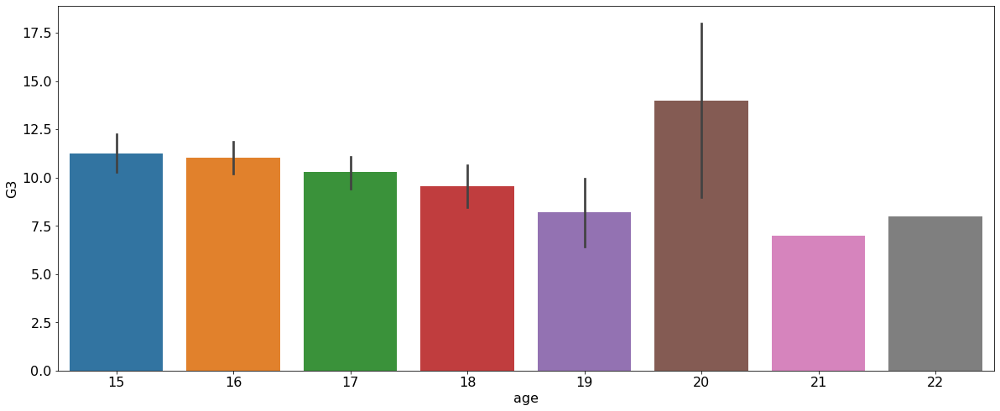

In [ ]:
fig_dims = (20, 8)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x = oriData["age"], y = oriData["G3"], ax=ax, data= oriData)

In [ ]:
# Calculate percentile for grades
oriData['percentile'] = oriData['G3'].apply(lambda x: percentileofscore(oriData['G3'], x))

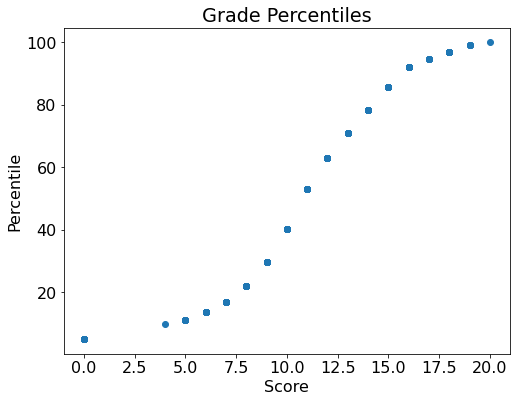

In [ ]:
# Plot percentiles for grades
plt.figure(figsize = (8, 6))
plt.plot(oriData['G3'], oriData['percentile'], 'o')
plt.xlabel('Score'); plt.ylabel('Percentile'); plt.title('Grade Percentiles');

In [ ]:
print('50th percentile score:', np.min(oriData.loc[oriData['percentile'] > 50, 'G3']))
print('Minimum Score needed for 90th percentile:', np.min(oriData.loc[oriData['percentile'] > 90, 'G3']))

50th percentile score: 11
Minimum Score needed for 90th percentile: 16


# Resampling Protocol

In [ ]:
X = newData.loc[:,newData.columns != 'G3']
y = newData['G3']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# Modeling

## Model training 

In [ ]:
regressors = [
    KNeighborsRegressor(),
    LinearRegression(),
    Lasso(),
    Ridge(),
    LinearSVR(),
    SVR(kernel="poly",degree=2),
    SVR(kernel="rbf"),
    MLPRegressor(),
    RandomForestRegressor(),
]

In [ ]:
newData.describe()

,school,sex,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,performanceFailure,Age_min_max,Absences_min_max,G3
count,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000
mean,0.116456,0.473418,0.222785,0.288608,0.896203,2.749367,2.521519,2.169620,1.450633,1.440506,0.389873,1.448101,2.035443,0.334177,0.870886,0.612658,0.458228,0.508861,0.205063,0.050633,0.832911,0.334177,3.944304,3.235443,3.108861,1.481013,2.291139,3.554430,9.774135,0.242315,0.076118,10.415190
std,0.321177,0.499926,0.416643,0.453690,0.305384,1.094735,1.088201,1.227473,0.889572,1.231309,0.633176,0.697505,0.839240,0.743651,0.335751,0.487761,0.498884,0.500555,0.404260,0.219525,0.373528,0.472300,0.896659,0.998862,1.113278,0.890741,1.287897,1.390303,4.388737,0.182292,0.106708,4.581443
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.500000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,2.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,6.400000,0.142857,0.000000,8.000000
50%,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000,2.000000,2.000000,1.000000,2.000000,0.000000,1.000000,2.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,10.000000,0.285714,0.053333,11.000000
75%,0.000000,1.000000,0.000000,1.000000,1.000000,4.000000,3.000000,3.000000,2.000000,3.000000,1.000000,2.000000,2.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,13.000000,0.428571,0.106667,14.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,4.000000,4.000000,4.000000,3.000000,2.000000,4.000000,4.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,19.000000,1.000000,1.000000,20.000000


KNeighborsRegressor()
	Training time: 0.004s
	Prediction time: 0.004s
	Explained variance: 0.6428110097175667
	Mean absolute error: 1.9206106870229005
	Mean squared error: 7.874198473282442
	R2 score: 0.6427839401084899

LinearRegression()
	Training time: 0.013s
	Prediction time: 0.003s
	Explained variance: 0.7529073446802395
	Mean absolute error: 1.590108420537267
	Mean squared error: 5.457043897976461
	R2 score: 0.7524390924988262

Lasso()
	Training time: 0.004s
	Prediction time: 0.004s
	Explained variance: 0.6789308222754945
	Mean absolute error: 1.7513594770344807
	Mean squared error: 7.138075238257875
	R2 score: 0.6761784554362771

Ridge()
	Training time: 0.006s
	Prediction time: 0.003s
	Explained variance: 0.7500555894082214
	Mean absolute error: 1.5764574357562133
	Mean squared error: 5.521157773450596
	R2 score: 0.7495305417353479

LinearSVR()
	Training time: 0.022s
	Prediction time: 0.003s
	Explained variance: 0.7216669801982747
	Mean absolute error: 1.496314984362508
	Mean sq

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



MLPRegressor()
	Training time: 0.469s
	Prediction time: 0.003s
	Explained variance: 0.7402929928629409
	Mean absolute error: 1.5451153590895732
	Mean squared error: 5.7358819897881625
	R2 score: 0.7397894945946573

RandomForestRegressor()
	Training time: 0.260s
	Prediction time: 0.012s
	Explained variance: 0.8194799351809752
	Mean absolute error: 1.2658015267175573
	Mean squared error: 4.006838167938931
	R2 score: 0.818228236457265



<BarContainer object of 9 artists>

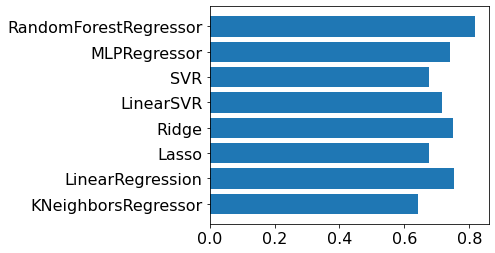

In [ ]:
from sklearn.metrics import mean_squared_error

R2Scores = []
Models = []

for model in regressors:
    start = time()
    model.fit(X_train, y_train)
    train_time = time() - start
    start = time()
    y_pred = model.predict(X_test)
    predict_time = time()-start
    Models.append(type(model).__name__)
    R2Scores.append(r2_score(y_test, y_pred)) 
    print(model)
    print("\tTraining time: %0.3fs" % train_time)
    print("\tPrediction time: %0.3fs" % predict_time)
    print("\tExplained variance:", explained_variance_score(y_test, y_pred))
    print("\tMean absolute error:", mean_absolute_error(y_test, y_pred))
    print("\tMean squared error:", mean_squared_error(y_test, y_pred))
    
    print("\tR2 score:", r2_score(y_test, y_pred))
    print()

plt.figure(figsize=(5,4))
plt.barh(Models,R2Scores)

## Grid Search on selected models

### Linear/Quadratic Methods
- Ridge
- KNeighborsRegressor
- LinearRegression

In [ ]:
R2ScoresFinalTest = []
R2ScoresFinalTrain = []
ModelName = []

In [ ]:
ridgeParam = {'alpha': [1,0.1,0.01,0.001,0.0001,0],
              'fit_intercept' : ["True","False"],
              'tol' : [10**-5, 10**-4, 10**-3, 10**-2],
              'solver'   : ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
              }

KNNParam = {'n_neighbors' : range(3,52,3),
               'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute'],
               'weights' : ["uniform","distance"],
               'metric' : ['euclidean','manhattan','minkowski']
               }

linRegParam = {'positive' : ["True","False"],
               'fit_intercept' : ["True","False"]
               }

In [ ]:
gridLinReg = GridSearchCV(LinearRegression(),linRegParam)
modelLinReg = gridLinReg.fit(X_train,y_train)
print(modelLinReg.best_params_,'\n')
print(modelLinReg.best_estimator_,'\n')

print('R2 train: ', modelLinReg.best_score_, ' R2 test: ', modelLinReg.score(X_test, y_test))

ModelName.append(type(LinearRegression()).__name__)
R2ScoresFinalTest.append(modelLinReg.best_score_)
R2ScoresFinalTrain.append(modelLinReg.score(X_test, y_test))

y_predLinReg = modelLinReg.predict(X_test)
print("\tR2 score:", r2_score(y_test, y_predLinReg))
print("\tExplained variance:", explained_variance_score(y_test, y_predLinReg))
print("\tMean absolute error:", mean_absolute_error(y_test, y_predLinReg))

{'fit_intercept': 'True', 'positive': 'True'} 

LinearRegression(fit_intercept='True', positive='True') 

R2 train:  0.7022460339748002  R2 test:  0.7623931151884222
	R2 score: 0.7623931151884222
	Explained variance: 0.7632703222806295
	Mean absolute error: 1.481574524126079


In [ ]:
gridRidge = GridSearchCV(Ridge(),ridgeParam)
modelRidge = gridRidge.fit(X_train,y_train)
print(modelRidge.best_params_,'\n')
print(modelRidge.best_estimator_,'\n')

print('R2 train: ', modelRidge.best_score_,' R2 test: ', modelRidge.score(X_test, y_test))

ModelName.append(type(Ridge()).__name__)
R2ScoresFinalTest.append(modelRidge.best_score_)
R2ScoresFinalTrain.append(modelRidge.score(X_test, y_test))

y_predRidge = modelRidge.predict(X_test)
print("\tR2 score:", r2_score(y_test, y_predRidge))
print("\tExplained variance:", explained_variance_score(y_test, y_predRidge))
print("\tMean absolute error:", mean_absolute_error(y_test, y_predRidge))

{'alpha': 1, 'fit_intercept': 'False', 'solver': 'saga', 'tol': 0.01} 

Ridge(alpha=1, fit_intercept='False', solver='saga', tol=0.01) 

R2 train:  0.6912004959287821  R2 test:  0.7435849798594182
	R2 score: 0.7435849798594182
	Explained variance: 0.744168408205439
	Mean absolute error: 1.5806324619124907


In [ ]:
gridKNN = GridSearchCV(KNeighborsRegressor(),KNNParam)
modelKNN = gridKNN.fit(X_train,y_train)
print(modelKNN.best_params_,'\n')
print(modelKNN.best_estimator_,'\n')

print('R2 train: ', modelKNN.best_score_,' R2 test: ', modelKNN.score(X_test, y_test))

ModelName.append(type(KNeighborsRegressor()).__name__)
R2ScoresFinalTest.append(modelKNN.best_score_)
R2ScoresFinalTrain.append(modelKNN.score(X_test, y_test))

y_predKNN = modelKNN.predict(X_test)
print("\tR2 score:", r2_score(y_test, y_predKNN))
print("\tExplained variance:", explained_variance_score(y_test, y_predKNN))
print("\tMean absolute error:", mean_absolute_error(y_test, y_predKNN))

{'algorithm': 'ball_tree', 'metric': 'euclidean', 'n_neighbors': 9, 'weights': 'distance'} 

KNeighborsRegressor(algorithm='ball_tree', metric='euclidean', n_neighbors=9,
                    weights='distance') 

R2 train:  0.6474701808340569  R2 test:  0.6909742255524063
	R2 score: 0.6909742255524063
	Explained variance: 0.6919897839293276
	Mean absolute error: 1.7460484438073398


### Non-linear Methods
- MLP
- Random Forest

In [ ]:
MLPParam = {
    'hidden_layer_sizes': [(10,30,10),(20,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
}

RForestParam = {
    'n_estimators': [100, 150, 200, 250, 300],
    'criterion'   : ['squared_error', 'absolute_error', 'poisson'],
    'max_depth': [3,5,9,11,15],
}

In [ ]:
gridMLP = GridSearchCV(MLPRegressor(),MLPParam)
modelMLP = gridMLP.fit(X_train,y_train)
print(modelMLP.best_params_,'\n')
print(modelMLP.best_estimator_,'\n')

print('R2 train: ', modelMLP.best_score_,' R2 test: ', modelMLP.score(X_test, y_test))

ModelName.append(type(MLPRegressor()).__name__)
R2ScoresFinalTest.append(modelMLP.best_score_)
R2ScoresFinalTrain.append(modelMLP.score(X_test, y_test))

y_predMLP = modelMLP.predict(X_test)
print("\tR2 score:", r2_score(y_test, y_predMLP))
print("\tExplained variance:", explained_variance_score(y_test, y_predMLP))
print("\tMean absolute error:", mean_absolute_error(y_test, y_predMLP))

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iter

{'activation': 'relu', 'alpha': 0.05, 'hidden_layer_sizes': (20,), 'learning_rate': 'constant', 'solver': 'sgd'} 

MLPRegressor(alpha=0.05, hidden_layer_sizes=(20,), solver='sgd') 

R2 train:  0.6851018150749763  R2 test:  0.7471776036531912
	R2 score: 0.7471776036531912
	Explained variance: 0.7481180289522134
	Mean absolute error: 1.4708759143289396


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



In [ ]:
gridRF = GridSearchCV(RandomForestRegressor(),RForestParam,return_train_score=True)
modelRF = gridRF.fit(X_train,y_train)
print(modelRF.best_params_,'\n')
print(modelRF.best_estimator_,'\n')

ModelName.append(type(RandomForestRegressor()).__name__)
R2ScoresFinalTest.append(modelRF.best_score_)
R2ScoresFinalTrain.append(modelRF.score(X_test, y_test))

print('R2 train: ', modelRF.best_score_,' R2 test: ', modelRF.score(X_test, y_test))


y_predRF = modelRF.predict(X_test)
print("\tR2 score:", r2_score(y_test, y_predRF))
print("\tExplained variance:", explained_variance_score(y_test, y_predRF))
print("\tMean absolute error:", mean_absolute_error(y_test, y_predRF))

{'criterion': 'squared_error', 'max_depth': 15, 'n_estimators': 150} 

RandomForestRegressor(max_depth=15, n_estimators=150) 

R2 train:  0.8122193130569556  R2 test:  0.8328970015473384
	R2 score: 0.8328970015473384
	Explained variance: 0.8341935798970557
	Mean absolute error: 1.2257506361323154


# Model selection

<BarContainer object of 5 artists>

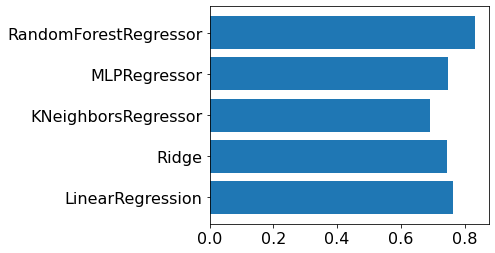

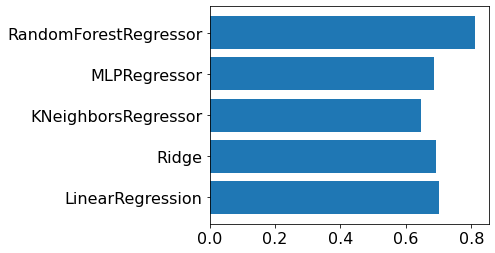

In [ ]:
plt.figure(figsize=(5,4))
plt.barh(ModelName,R2ScoresFinalTrain)

plt.figure(figsize=(5,4))
plt.barh(ModelName,R2ScoresFinalTest)

In [ ]:
def plot_search_results(grid):
    """
    Params: 
        grid: A trained GridSearchCV object.
    """
    ## Results from grid search
    results = grid.cv_results_
    means_test = results['mean_test_score']
    stds_test = results['std_test_score']
    means_train = results['mean_train_score']
    stds_train = results['std_train_score']

    ## Getting indexes of values per hyper-parameter
    masks=[]
    masks_names= list(grid.best_params_.keys())
    for p_k, p_v in grid.best_params_.items():
        masks.append(list(results['param_'+p_k].data==p_v))

    params=grid.param_grid

    ## Ploting results
    fig, ax = plt.subplots(1,len(params),sharex='none', sharey='all',figsize=(20,5))
    fig.suptitle('Score per parameter')
    fig.text(0.04, 0.5, 'MEAN SCORE', va='center', rotation='vertical')
    pram_preformace_in_best = {}
    for i, p in enumerate(masks_names):
        m = np.stack(masks[:i] + masks[i+1:])
        pram_preformace_in_best
        best_parms_mask = m.all(axis=0)
        best_index = np.where(best_parms_mask)[0]
        x = np.array(params[p])
        y_1 = np.array(means_test[best_index])
        e_1 = np.array(stds_test[best_index])
        y_2 = np.array(means_train[best_index])
        e_2 = np.array(stds_train[best_index])
        ax[i].errorbar(x, y_1, e_1, linestyle='--', marker='o', label='test')
        ax[i].errorbar(x, y_2, e_2, linestyle='-', marker='^',label='train' )
        ax[i].set_xlabel(p.upper())

    plt.legend()
    plt.show()

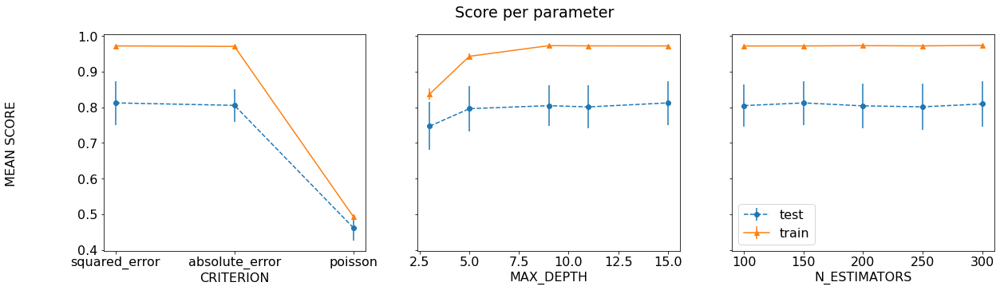

In [ ]:
plot_search_results(modelRF)

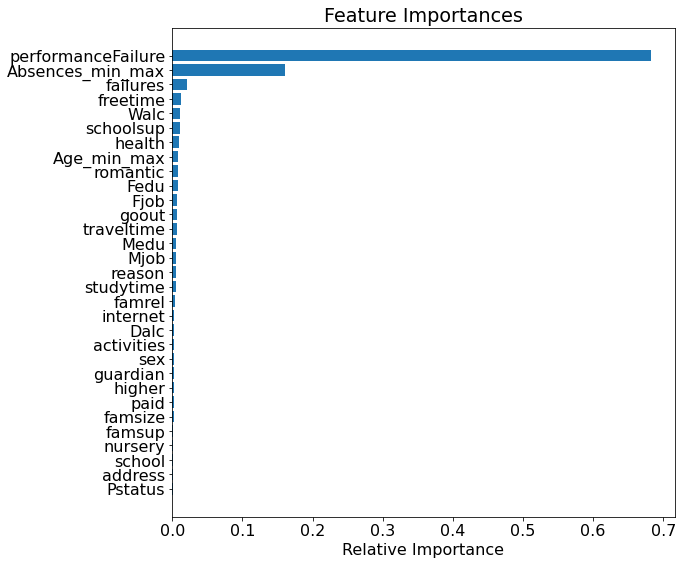

In [ ]:
features = list(newData.columns)
importances = modelRF.best_estimator_.feature_importances_
indices = np.argsort(importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices])
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

## Final model

In [ ]:
from sklearn import tree

random_forest = RandomForestRegressor(criterion='absolute_error', max_depth=9, n_estimators=100)
random_forest.fit(X_train, y_train)
y_pred = random_forest.predict(X_test)

fn=features
cn="G3"
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(random_forest.estimators_[0],
              feature_names = fn,fontsize=10,
              class_names=cn,
              filled = True);

In [ ]:
LinReg = LinearRegression(fit_intercept = True, positive = True)
modelLinReg = LinReg.fit(X_train, y_train)


y_predLinReg = modelLinReg.predict(X_test)

In [ ]:
weights = pd.DataFrame({'LR':modelLinReg.coef_, 'RF':random_forest.feature_importances_},index=X_train.columns)
weights.T

,school,sex,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,performanceFailure,Age_min_max,Absences_min_max
LR,0.179285,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.121763,0.053337,0.266427,0.035250,0.000000,2.466105,0.000000,0.000000,0.350665,0.000000,0.486749,0.000000,0.000000,0.000000,0.345808,0.000000,0.027348,0.00000,0.060686,0.067030,1.147557,0.000000,4.448791
RF,0.003048,0.003924,0.001548,0.00542,0.002318,0.00804,0.012724,0.012648,0.014725,0.007804,0.005692,0.009863,0.009962,0.028710,0.012199,0.002904,0.003555,0.003974,0.003689,0.001045,0.004874,0.008918,0.011938,0.016293,0.013408,0.00749,0.015170,0.011314,0.622275,0.014129,0.120399


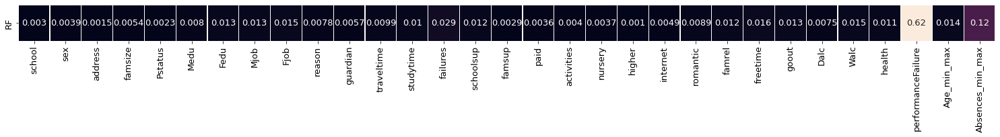

In [ ]:
plt.figure(figsize = (26,1))
matplotlib.rcParams['font.size'] = 13
sns.heatmap(weights.T.loc[['RF'],:].abs(),annot=True, linewidths=.1,cbar=False,xticklabels=True)

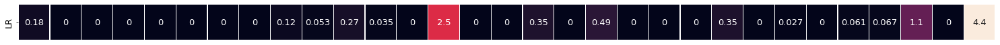

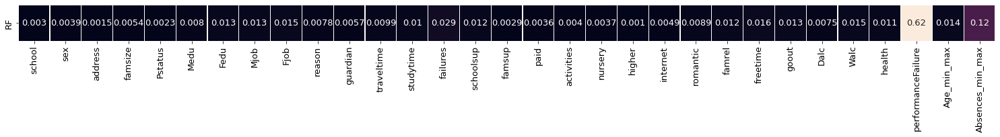

In [ ]:
fig,  ax = plt.subplots(figsize = (26,1))
matplotlib.rcParams['font.size'] = 13
sns.heatmap(weights.T.loc[['LR'],:].abs(),annot=True, linewidths=.1,ax=ax,cbar=False,xticklabels=False)

plt.figure(figsize = (26,1))
matplotlib.rcParams['font.size'] = 13
sns.heatmap(weights.T.loc[['RF'],:].abs(),annot=True, linewidths=.1,cbar=False,xticklabels=True)

In [ ]:
!pip freeze > requirements.txt